In [1]:
''' FOR DEVELOPMENT ONLY, DELETE CELL '''

# set auto reload imported modules tagged
%load_ext autoreload
%autoreload 2

# data array processing
import numpy as np
#import pandas as pd

# plotting with matplotlib
%matplotlib widget
from matplotlib import pyplot as plt

## development override params
libs_path = '/home/brendan/dev/pvmod'

# add pvmod to path
import sys
sys.path.append(libs_path)

# import pvlibs package
import pvmod_libs as pvmod


In [2]:
''' processing imports '''

from PIL import Image
import skimage
import scipy

import matplotlib.colors as colors
import matplotlib.cm as cmx

import hdbscan

#from sklearn.cluster import KMeans


import matplotlib.colors as colors
import matplotlib.cm as cmx

from matplotlib.gridspec import GridSpec
from matplotlib.colors import Normalize

In [3]:
''' 
    image dataset import
    
'''

' \n    image dataset import\n    \n'

In [4]:
''' build image database '''

# set image folder path
_path = '../data/pavlov/EL-IV Pair Second Life Modules/EL Images/'
#_path = '../data/carpark/Willoughby/Willoughby_Friday/2022-05-27/TIF/'
#_path = './data/'
#_path = '../data/zubair/'

# set file properties
#_props = {'file_ext': 'tif'}
_props = {'file_ext': 'jpg'}

# initialise database
db = []

# build initial database from files
pvmod.add_files(db, _path , _props)

len(db)

66

In [5]:
db[0]

{'file_ext': 'jpg',
 'file_name': '151102000102021_9p01_20220505T095741_CROPPED-Standard Characterizations-Characterization.jpg',
 'file_path': '../data/pavlov/EL-IV Pair Second Life Modules/EL Images'}

In [6]:
''' import jpg image data '''

for n in db:
    
    # import jpg data from file
    img = Image.open('{}/{}'.format(n['file_path'], n['file_name']))
    
    if n['file_ext'] == 'jpg':
        # convert to luminance channel and to np array if jpg
        img = np.array(img.convert('L'))
    else:
        # as array for tif
        img = np.array(img)
    
    n['raw_img'] = img
    

In [7]:
db[0]

{'file_ext': 'jpg',
 'file_name': '151102000102021_9p01_20220505T095741_CROPPED-Standard Characterizations-Characterization.jpg',
 'file_path': '../data/pavlov/EL-IV Pair Second Life Modules/EL Images',
 'raw_img': array([[41, 38, 55, ..., 52, 44, 50],
        [38, 32, 38, ..., 55, 51, 53],
        [51, 40, 36, ..., 47, 45, 48],
        ...,
        [43, 45, 44, ..., 51, 38, 34],
        [37, 41, 41, ..., 54, 44, 35],
        [38, 44, 44, ..., 55, 41, 35]], dtype=uint8)}

(3311, 2105)


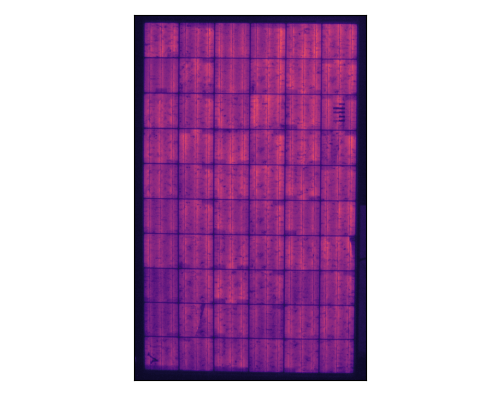

In [8]:
''' plot module image '''

# diplay images
_w = 5; _h = 4; fig = plt.figure(figsize = (_w, _h))
ax = []; ax.append(fig.add_subplot(111))#; ax.append(fig.add_subplot(122))

# define image file
i = 34

# get module PL image
img = db[i]['raw_img'].copy()
print(img.shape)

# display image, limit range 8-bit
#ax[0].imshow(img, cmap = 'magma', vmin = 0, vmax = 256)
ax[0].imshow(img, cmap = 'magma')#, vmin = img.min(), vmax = img.max())
ax[0].set_xticks([]); ax[0].set_yticks([])

plt.tight_layout()
plt.show()

In [11]:
''' prepare image '''

# lens distortion correction
#img = pvmod.apply_lens(img.copy(),-5e-6,8)

# normalise intensity
_img = img.copy()/img.max()


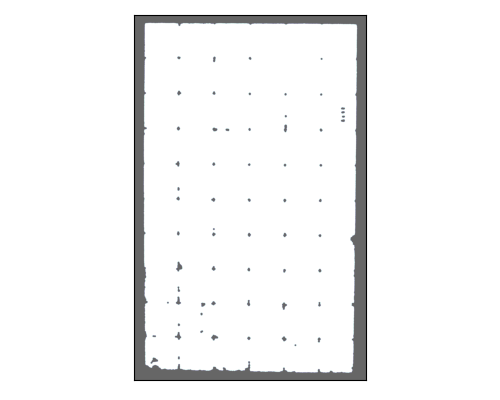

In [12]:
''' generate foreground mask '''

# diplay images
_w = 5; _h = 4; fig = plt.figure(figsize = (_w, _h))
ax = []; ax.append(fig.add_subplot(111))#; ax.append(fig.add_subplot(122))

# get clean foreground mask
_img = pvmod.mask_clean( _img, _r = 8, clean = True ) ## reduced radius

ax[0].imshow(_img, cmap = 'bone', alpha = 0.6)

ax[0].set_xticks([]); ax[0].set_yticks([])
plt.tight_layout()
plt.show()

1


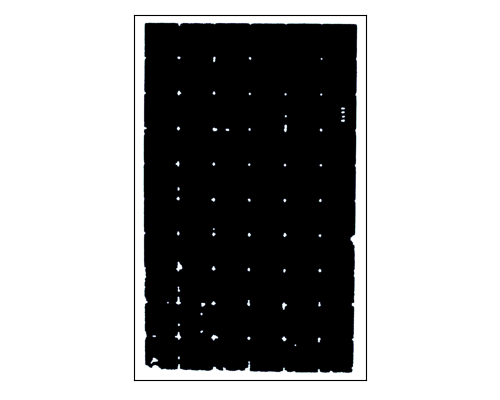

In [13]:
''' separate features (cells) in mask '''

# diplay images
_w = 5; _h = 4; fig = plt.figure(figsize = (_w, _h))
ax = []; ax.append(fig.add_subplot(111))#; ax.append(fig.add_subplot(122))

##_mask = pvmod.mask_single( _img )

# use measure to identify closed features in binary mask
lmask = skimage.measure.label(_img, background = 0)

lmasks = []
for l in np.unique(lmask)[1:]:
    #print(l)
    
    # isolate single cell
    _mask = lmask.copy()
    _mask[np.where(lmask != l)] = 0
    _mask[np.where(_mask != 0)] = 1
    
    # filter for only images of min pixel count
    if len(np.where(_mask == 1)[0]) > 100000:
    
        # save cell mask
        lmasks.append(_mask)
        print(l)
    
# display image, limit range 8-bit
ax[0].imshow(lmask, cmap = 'bone_r',)# vmin = dst.min(), vmax = dst.max())

ax[0].set_xticks([]); ax[0].set_yticks([])
plt.tight_layout()
plt.show()

[[  78  133]
 [  78  134]
 [  78  135]
 ...
 [3246 1940]
 [3246 1941]
 [3246 1942]]


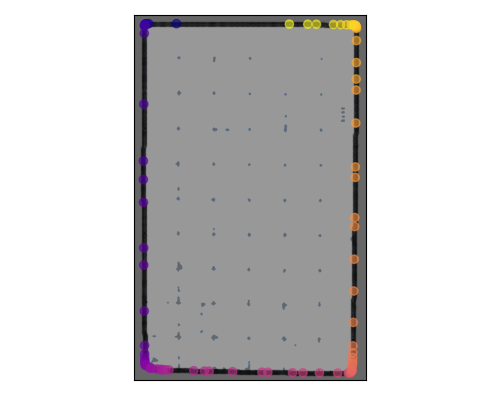

In [14]:
''' plot module image with convex hull points '''

# diplay images
_w = 5; _h = 4; fig = plt.figure(figsize = (_w, _h))
ax = []; ax.append(fig.add_subplot(111))#; ax.append(fig.add_subplot(122))

# select single mask (isolated cell)
i = 0
_mask = lmasks[i]

# display image, limit range 8-bit
ax[0].imshow(_mask, cmap = 'bone_r',)# vmin = dst.min(), vmax = dst.max())
ax[0].imshow(_img, cmap = 'bone', alpha = 0.6)
ax[0].set_xticks([]); ax[0].set_yticks([])

# get feature edge points, convex hull points
pts, _edg = pvmod.mask_corner_hull_image(_mask, _filter = False, _edge = True)
#pts = pvmod.mask_corner_hull_image(_mask, _filter = True)

# get set colour map
cnorm = colors.Normalize(vmin = 0, vmax = pts.shape[0])
smap = cmx.ScalarMappable(norm = cnorm, cmap = 'plasma')
cs = smap.to_rgba(list(range(pts.shape[0])))

# plot edge points
plt.scatter(_edg[:,0][::10], _edg[:,1][::10], color = 'k', alpha = 0.1, marker = '.')

# plot convex hull points
plt.scatter(pts[:,0], pts[:,1], color = cs, alpha = 0.6)

plt.tight_layout()
plt.show()

In [15]:
''' compute points for edge lines '''

# sum distance all points to line (adjacent point pair)
ds = []

# iterate over all points pairs
for i in range(pts.shape[0]-1)[:]:
    #print(i, i+1)
    
    # get adjacent points
    p1 = pts[i,:].astype(np.float32)
    p2 = pts[i+1,:].astype(np.float32)

    # compute distance of each point from line (two adjacent points)
    #d = np.abs( np.cross(p2-p1,pts-p1)/np.linalg.norm(p2-p1) )
    
    # compute distance of all edge point
    d = np.abs( np.cross(p2-p1,_edg[::10]-p1)/np.linalg.norm(p2-p1) )
    #print(d.sum())
    
    # apply weighting by distance (higher weight to points close to line)
    #_d = np.log(d[np.where(d != 0)])
    #_d = d[np.where(d != 0)]**2
    _d = d[np.where(d != 0)]**0.8
    
    # store sum total distance
    ds.append(np.sum(_d)/len(_d))
    

# get index max distance (a corner)
i = np.where(ds == np.max(ds))[0][0]

# re-order to start at corner
ds = np.roll(ds, -i)

# roll points to match
_pts = np.roll(pts, -i, axis = 0)
    

In [16]:
''' compute hull point spacing and perimeter distance '''

# compute hull pt-pt spacing
spc = np.array([0.]+[ np.linalg.norm(_pts[i+1,...]-_pts[i,...]) for i in range(_pts.shape[0]-1) ])

# compute cum sum perimeter hull
pmt = np.cumsum(spc)

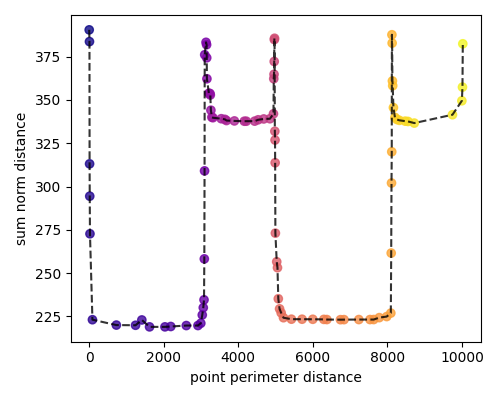

In [17]:
''' display point distance over perimeter '''

from scipy.interpolate import splrep, splev

# diplay images
_w = 5; _h = 4; fig = plt.figure(figsize = (_w, _h))
ax = []; ax.append(fig.add_subplot(111))#; ax.append(fig.add_subplot(122))

# get set colour map
cnorm = colors.Normalize(vmin = 0, vmax = len(ds))
smap = cmx.ScalarMappable(norm = cnorm, cmap = 'plasma')
cs = smap.to_rgba(list(range(len(ds))))

# perimeter and distance
x = pmt[1:]
y = ds

# plot
plt.plot(x, y, '--k', alpha = 0.8)
plt.scatter(x, y, alpha = 0.8, color = cs)

plt.ylabel('sum norm distance')
plt.xlabel('point perimeter distance')

plt.tight_layout()
plt.show()

[-1  0  1  2  3]


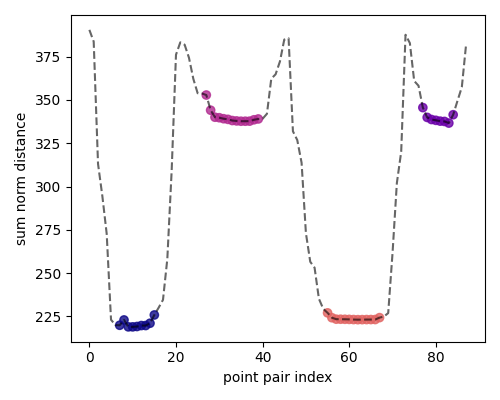

In [18]:
''' compute edge point clusters - hdbscan '''

# diplay images
_w = 5; _h = 4; fig = plt.figure(figsize = (_w, _h))
ax = []; ax.append(fig.add_subplot(111))#; ax.append(fig.add_subplot(122))


# get set colour map
cnorm = colors.Normalize(vmin = 0, vmax = len(ds))
smap = cmx.ScalarMappable(norm = cnorm, cmap = 'plasma')
cs = smap.to_rgba(list(range(len(ds))))

plt.plot(ds, '--k', alpha = 0.6)
#plt.scatter(range(len(ds)), ds, alpha = 0.8, color = cs)

# stack index, distance, coordinates, perimeter, etc. (select features to cluster), selective normalise
X = np.stack([
    # index
    list(range(len(ds))),
    
    # midpoint coordinates of point pair
    #(_pts[:-1,1]+(_pts[:-1,1] - _pts[1:,1]))/_pts[:,1].max(),
    #(_pts[:-1,0]+(_pts[:-1,0] - _pts[1:,0]))/_pts[:,0].max(),
    
    # norm distance, derivative measure
    len(ds)*(ds-np.min(ds))/np.max(ds),
    #(ds-np.min(ds))/np.max(ds),
    #ds,
    
    # point-point spacing
    spc[1:]/np.max(spc[1:]),
    #spc[1:],
    
    # perimeter distance
    pmt[1:]/np.max(pmt[1:]),
    #pmt[1:],
    
], axis = 1)

# select/filter dataset
_X = X
#_idx = np.where(X[:,3]<130)[0]
#_X = X[_idx,...]

# compute 4 edge clusters with k-means
#kmeans = KMeans(n_clusters = 4, random_state=25).fit(_X)
#lbls = kmeans.labels_


# hdbscan clustering, smallest min cluster size, sort/filter after
clusterer = hdbscan.HDBSCAN(min_cluster_size=5)
clusterer.fit(_X)
lbls = clusterer.labels_
probs = clusterer.probabilities_

print(np.unique(lbls))

cnorm = colors.Normalize(vmin = 0, vmax = len(np.unique(lbls)))
smap = cmx.ScalarMappable(norm = cnorm, cmap = 'plasma')
cs = smap.to_rgba(lbls)

# optinal filter points for display
#idx = np.where(rr < np.std(rr)*1.5)[0]
idx = np.where(probs > .8)[0]
#idx = list(range(len(ds)))

# plot points, clusters by colour
plt.scatter(idx, ds[idx], alpha = 0.8, color = cs[idx])
#plt.scatter(pmt[idx], ds[idx], alpha = 0.8, color = cs[idx])
#plt.scatter(_X[idx,4], _X[idx,2], alpha = 0.8, color = cs[idx])

plt.ylabel('sum norm distance')
plt.xlabel('point pair index')

plt.tight_layout()
plt.show()

In [19]:
''' sort, filter clusters for only 4 edges '''

# labels
lset = np.array([_ for _ in np.unique(lbls) if _ != -1])
print(lset)

# get mean dist of each cluster
lmap = np.stack([ [l, np.mean(ds[np.where(lbls == l)[0]])] for l in lset ])
print(lmap)

# get labels of lowest 4 clusters (mean dist)
_lu = lset[ np.argsort(lmap, 0)[:,1] ][:4]
print(_lu)

[0 1 2 3]
[[  0.         233.3953937 ]
 [  1.         348.45666129]
 [  2.         349.78090273]
 [  3.         231.86816699]]
[3 0 1 2]


In [20]:
''' find minimum pairs in each cluster '''

js = []

# iterate over sides (labels excluding -1)
for l in [ _ for _ in np.unique(lbls) if _ != -1 and _ in _lu ]:
    
    # get label index
    k = list(np.where(lbls == l)[0])
    
    # filter outliers
    k = [_ for _ in k if _ in idx]
    
    # compute min pair index
    j = [ _ for _ in k if ds[_] == np.min(ds[k]) ][0]
    #j = [ _ for _ in k if _X[:,3][_] == np.min(_X[:,3][k]) ][0]
    #j = [ _ for _ in k if ds[_idx][_] == np.min(ds[_idx][k]) ][0]
    print(j)
    
    js.append(j)

# sort order pairs
_js = list(np.array(js)[np.argsort(js)])

10
83
35
62


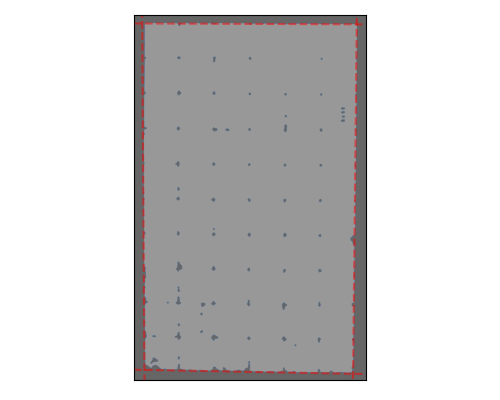

In [21]:
''' compute lines for each point pair '''

# diplay images
_w = 5; _h = 4; fig = plt.figure(figsize = (_w, _h))
ax = []; ax.append(fig.add_subplot(111))#; ax.append(fig.add_subplot(122))

# display image, limit range 8-bit
ax[0].imshow(_mask, cmap = 'bone_r',)# vmin = dst.min(), vmax = dst.max())
ax[0].imshow(_img, cmap = 'bone', alpha = 0.6)
ax[0].set_xticks([]); ax[0].set_yticks([])

# iterate over all points pairs (shift by one for bias)
for i in np.array(_js)+1:
    #print(i, i+1)
    
    # get adjacent points
    p1 = _pts[i,:].astype(np.float32)
    p2 = _pts[i+1,:].astype(np.float32)

    # compute gradient of line
    _grad = (p2[1] - p1[1])/(p2[0] - p1[0])
    #print(_grad)

    # compute line intercept (y = mx + b)
    _b = p1[1] - _grad*p1[0]
    #y_0 = p2[0]*_grad + _b
    y_0 = p2[0]*_grad + _b
    y_m = _img.shape[0]*_grad + _b
    
    #line = skimage.draw.line(i, 0, j, img.shape[1]-1,)
    
    # compute points for line
    _x = np.arange(0,_img.shape[1])
    _y = _x*_grad + _b

    # plot line of adjacent points
    plt.plot(_x,_y, '--r', alpha = 0.5)
    #print(_b, y_0, y_m)
    
    
plt.xlim(0,_img.shape[1], )
plt.ylim(_img.shape[0], 0)

plt.tight_layout()
plt.show()

In [22]:
''' compute corner points from line intersection '''

def line_intersection(line1, line2):
    xdiff = (line1[0][0] - line1[1][0], line2[0][0] - line2[1][0])
    ydiff = (line1[0][1] - line1[1][1], line2[0][1] - line2[1][1])

    def det(a, b):
        return a[0] * b[1] - a[1] * b[0]

    div = det(xdiff, ydiff)
    #if div == 0:
    #   raise Exception('lines do not intersect')

    d = (det(*line1), det(*line2))
    x = det(d, xdiff) / div
    y = det(d, ydiff) / div
    return x, y


crns = []

# iterate over all points pairs
ii = list(np.array(_js)+1)
ii += [ii[0]]
for i in range(len(ii)-1):
    #print(i, i+1)
    
    # get adjacent points
    p1 = _pts[ii[i],:].astype(np.float32)
    p2 = _pts[ii[i]+1,:].astype(np.float32)
    
    # get second adjacent point pair
    p3 = _pts[ii[i+1],:].astype(np.float32)
    p4 = _pts[ii[i+1]+1,:].astype(np.float32)
    
    crns.append( line_intersection((p1, p2), (p3, p4)) )
    print( crns[-1] )

# stack into array
crns = np.stack(crns)

# sort and order corners for transform
#_crns = crns[np.argsort(crns, axis = 0)[:,1]][[0,2,1,3]]
#_crns = crns[np.argsort(crns, axis = 0)[:,1]][[0,2,1,3]]


''' correctly sort corner points for transform '''

crns_ = np.sum(crns, axis = 1)

#a = []
a = np.where(crns_ == crns_.min())[0][0]
b = np.where(crns_ == crns_.max())[0][0]

crns_ = [ _ for _ in range(len(crns)) if _ not in [a,b] ]
abc = crns[crns_][:,0]

c = crns_[np.where(abc == abc.min())[0][0]]
d = crns_[np.where(abc != abc.min())[0][0]]

_crns = np.stack([ crns[_] for _ in [a,c,d,b] ],axis = 0)
_crns

(95.097946, 3218.2795)
(1987.2493, 3253.3193)
(2020.6064, 84.389084)
(74.96018, 76.78891)


array([[  74.96018 ,   76.78891 ],
       [  95.097946, 3218.2795  ],
       [2020.6064  ,   84.389084],
       [1987.2493  , 3253.3193  ]], dtype=float32)

0.61933047 0.597164 0.6082472
(1280, 2105)


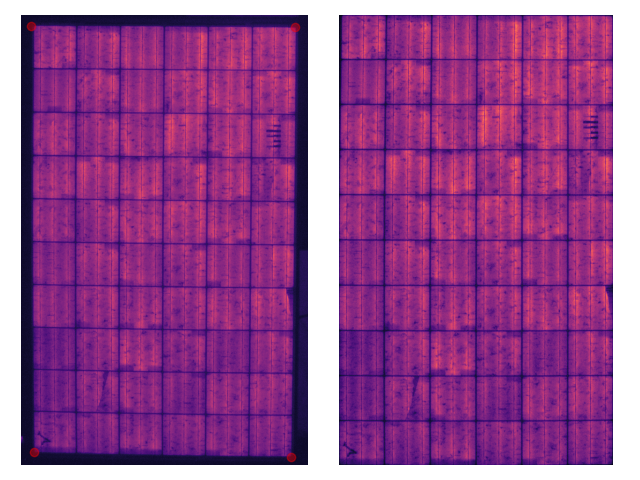

In [23]:
''' perspective transform and crop using corners '''

# diplay images
#_w = 8; _h = 3; fig = plt.figure(figsize = (_w, _h))
fig = plt.figure()
ax = []; ax.append(fig.add_subplot(121)); ax.append(fig.add_subplot(122))

# reset image to raw intensity
_img = img


# perform perspective transform to remove skew/rotation, crop to edges
wrp = pvmod.deskew_crop(_img, _crns)

# plot raw image with corner points
ax[0].imshow(_img, cmap = 'magma', )#vmin = 0, vmax = 256)
ax[0].scatter(_crns[:,0], _crns[:,1], color = 'r', alpha = 0.4)

# plot final cropped image
#ax[1].imshow(wrp[:,::-1], cmap = 'magma', )#vmin = 0, vmax = 256)
ax[1].imshow(wrp[:,::], cmap = 'magma', )#vmin = 0, vmax = 256)

ax[0].set_axis_off()
ax[1].set_axis_off()

plt.tight_layout()
plt.show()

In [22]:
''' 
    detailed image module segmentation (step-by-step)
    
'''

' \n    detailed image module segmentation (step-by-step)\n    \n'

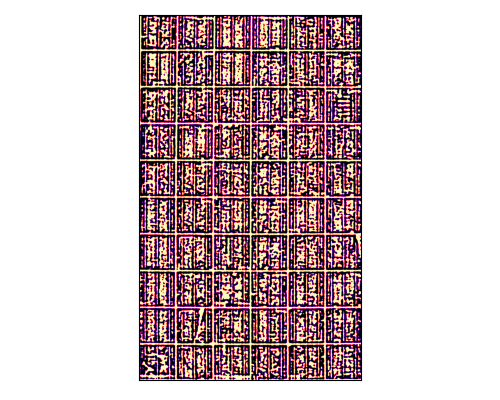

In [24]:
''' contrast edge line mask '''

_w = 5; _h = 4; fig = plt.figure(figsize = (_w, _h))
ax = []; ax.append(fig.add_subplot(111))#; ax.append(fig.add_subplot(122))

# compute edge contrast image
fimg = pvmod.edge_contrast(wrp, 20)

ax[0].imshow(1-fimg, cmap = 'magma')
ax[0].set_xticks([]); ax[0].set_yticks([])

plt.tight_layout()
plt.show()

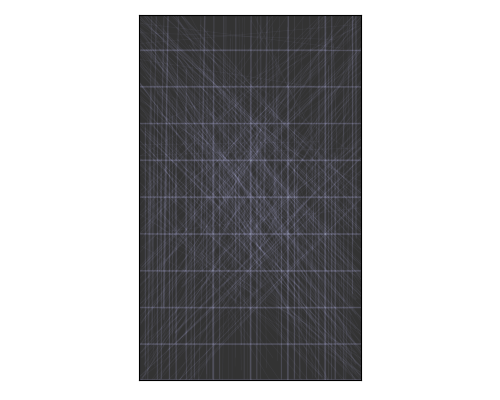

In [28]:
''' contrast edge line mask '''

_w = 5; _h = 4; fig = plt.figure(figsize = (_w, _h))
ax = []; ax.append(fig.add_subplot(111))#; ax.append(fig.add_subplot(122))

# compute edge contrast image
fimg = pvmod.edge_contrast(wrp, 20)

# generate edge line mask
lmask = pvmod.line_mask(fimg)

#ax[0].imshow(wrp, cmap = 'magma')
ax[0].imshow(lmask, cmap = 'bone', alpha = 0.8)
ax[0].set_xticks([]); ax[0].set_yticks([])

plt.tight_layout()
plt.show()

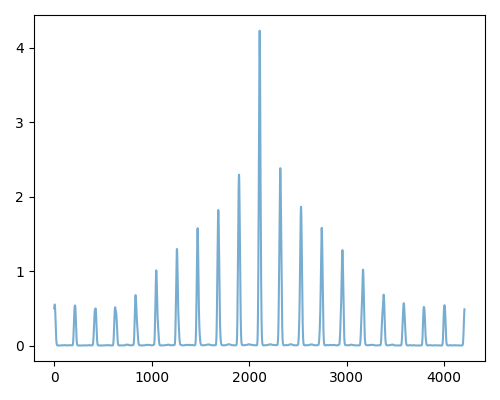

In [32]:
''' autocorrelation of image axis sum for cell line spacing '''

## effective filter for edge line by orientation (only image axis aligned edges)

_w = 5; _h = 4; fig = plt.figure(figsize = (_w, _h))
ax = []; ax.append(fig.add_subplot(111))#; ax.append(fig.add_subplot(122))


k = 1
_ac = pvmod.edge_autocorr(lmask, k)


ax[0].plot(_ac, alpha =  0.6)

plt.tight_layout()

plt.show()

210
4


/home/brendan/dev/pvmod/pvmod_libs/segment.py:162: RuntimeWarning: divide by zero encountered in true_divide
  lll = np.cumsum(per) / np.arange(per.shape[0])


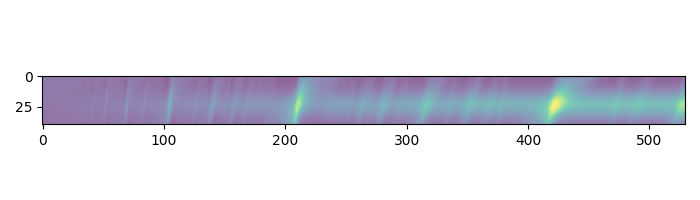

In [33]:
''' compute peak period map with window function '''

_w = 7; _h = 2; fig = plt.figure(figsize = (_w, _h))
ax = []; ax.append(fig.add_subplot(111))#; ax.append(fig.add_subplot(122))

sh = 20
# get edge autocorrelation map
_map = pvmod.period_map(_ac, sh)

# compute period and phase shift
_per, m, pha, _m = pvmod.period_phase(_map, sh)

ax[0].imshow(_map, alpha =  0.6)

plt.tight_layout()
plt.show()   

/tmp/ipykernel_3121/526028247.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  _w = 8; _h = 4; fig = plt.figure(figsize = (_w, _h))


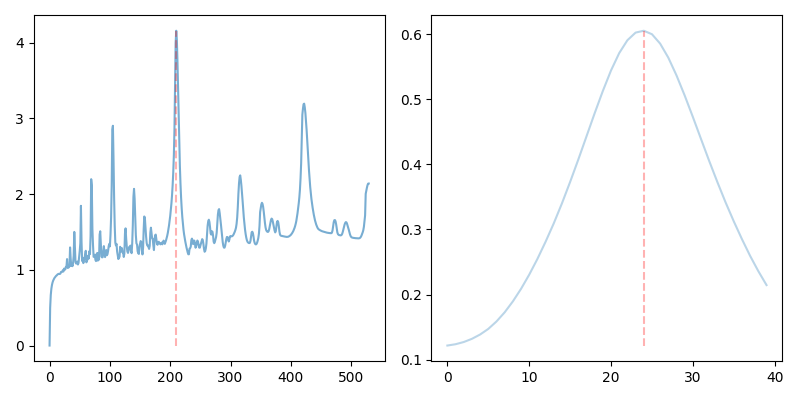

In [35]:
''' window average period '''

_w = 8; _h = 4; fig = plt.figure(figsize = (_w, _h))
ax = []; ax.append(fig.add_subplot(121)); ax.append(fig.add_subplot(122))

# cell edge spacing period
ax[0].plot(_per, alpha =  0.6)
ax[0].plot([m, m], [_per.min(), _per.max()], '--r', alpha =  0.3)

# phase shift
ax[1].plot(pha, alpha =  0.3)
ax[1].plot([_m+sh, _m+sh], [pha.min(), pha.max()], '--r', alpha =  0.3)


plt.tight_layout()
plt.show()

210
4
213
4
[10  6]
[ 210  420  630  840 1050 1260 1470 1680 1890 2100] [ 213  426  639  852 1065 1278]
(2105, 1280) (2105, 1280)


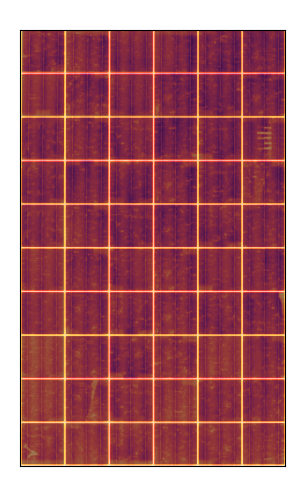

In [41]:
''' plot module image '''

# diplay images
_w = 3; _h = 5; fig = plt.figure(figsize = (_w, _h))
#fig = plt.figure()
ax = []; ax.append(fig.add_subplot(111))#; ax.append(fig.add_subplot(122))


# compute cell edge spacing, shift
period, shift = pvmod.cell_spacing(lmask, 10)

# generate cell segmentation grid
#grid = pvmod.gen_grid(wrp.shape, period, shift*-.5, pad = 4, edge = 8)
grid = pvmod.gen_grid(wrp.shape, period, shift, pad = 4, edge = 8)
#grid = pvmod.gen_grid(wrp.shape, period, [4,4], pad = 2)
print( wrp.shape, grid.shape)

# display image, limit range 8-bit
ax[0].imshow(wrp, cmap = 'magma_r')
ax[0].imshow(grid, cmap = 'hot', vmin = 0, vmax = 1, alpha = 0.4)
ax[0].set_xticks([]); ax[0].set_yticks([])

plt.tight_layout()
plt.show()

In [29]:
''' 
    module segmentation and cell extraction
    
'''

' \n    module segmentation and cell extraction\n    \n'

210
4
213
4
[10  6]
[ 210  420  630  840 1050 1260 1470 1680 1890 2100] [ 213  426  639  852 1065 1278]
(2105, 1280) (2105, 1280)


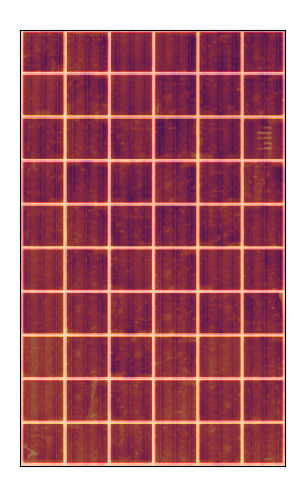

In [42]:
''' plot module image '''

# diplay images
_w = 3; _h = 5; fig = plt.figure(figsize = (_w, _h))
#fig = plt.figure()
ax = []; ax.append(fig.add_subplot(111))#; ax.append(fig.add_subplot(122))


# compute edge contrast image
fimg = pvmod.edge_contrast(wrp, 20)

# generate edge line mask
lmask = pvmod.line_mask(fimg)

# compute cell edge spacing, shift
period, shift = pvmod.cell_spacing(lmask, 10)

# generate cell segmentation grid
grid = pvmod.gen_grid(wrp.shape, period, shift, pad = 8, edge = 16)
#grid = pvmod.gen_grid(wrp.shape, period, [4,4], pad = 2)
print( wrp.shape, grid.shape)

# display image, limit range 8-bit
ax[0].imshow(wrp, cmap = 'magma_r')
ax[0].imshow(grid, cmap = 'hot', vmin = 0, vmax = 1, alpha = 0.4)
ax[0].set_xticks([]); ax[0].set_yticks([])

plt.tight_layout()
plt.show()

In [43]:
''' extract module cell images '''

cells = pvmod.extract_cells(wrp, grid)

print(len(cells))

# get max dimensions of cells
_shape = np.max(np.stack(list(set([ _cell.shape for _cell in cells ]))), axis = 0)

# filter for only full cells (exclude if either dimension less than 90% max)
cells = [ _ for _ in cells if -np.min(np.array(_.shape) - _shape) < min(_shape)*0.9 ]
print(len(cells))


60
60


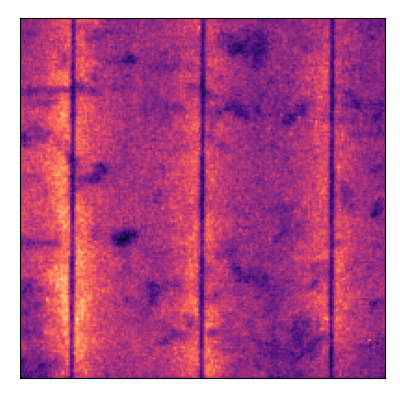

In [46]:
''' select cell image by label '''

#_cell = cells[-1].copy()
_cell = cells[14].copy()

# diplay images
_w = 4; _h = 4; fig = plt.figure(figsize = (_w, _h))
ax = []; ax.append(fig.add_subplot(111))#; ax.append(fig.add_subplot(122))

#_cell = gaussian_filter(_cell, sigma = 0.5)

#_cell = ndimage.morphological_gradient(_cell, size = (3,3))

ax[0].imshow(_cell, cmap = 'magma')

ax[0].set_xticks([]); ax[0].set_yticks([])

plt.tight_layout()
plt.show()


In [33]:
''' module quality assessment '''

' module quality assessment '

In [44]:

''' perform threshold-based quality assessment '''

_cells = cells.copy()

# compute cell image stack, reference image, abs scale factor
_stack, _ref, _fact, abs_stats = pvmod.stack_cell_imgs(_cells)


# compute residual stack, residuals (degrade), low variance (cracks), high variance (hotspots)
res, _res, _std, _hot = pvmod.compute_residual(_stack, _ref, _fact)


# get cell index each classfied defect
# thresh: dead, degr, damg, defc, hots, hotc
#_thresh = [-3.0, -2.0, .75, .55, .5, 3.5]
_thresh = [-3.0, -2.0, .6, .3, .5, 3.5]
_dead, _damg, _defc, _degr, _hots, _hotc = pvmod.classify_cells(_res, _std, _hot, thresh = _thresh)



[190 198] [186 174] [ 4 24]
[ 4 24]
(60, 186, 174)
min 55.000 	 max 209.000 	median 139.500 	mean 135.583
ptp 153.000 	 std 32.228
scale factor 1.097
residual mean -0.403, std dev 1.665, min -6.242
variance mean 0.406, std dev 0.274, min 0.062
variance mean 0.349, std dev 0.469, min 0.037
dead: 2, damg: 15, defc: 16, degr: 8, hots: 12, hotc: 1


In [45]:

''' compute stats and eol decision '''

# compute defect totals for risk, warn rating
_risk = sum([ len(_) for _ in [_dead, _damg, _hots] ])
_warn = sum([ len(_) for _ in [_defc, _degr, _hotc] ])
print(_risk, _warn)

# assign quality bin
if (_risk < 1) and (_warn < 20):
    _qbin = 1

elif (_risk < 1) and (_warn >= 20):
    _qbin = 2

elif (_risk < 5) and (_warn < 20):
    _qbin = 3

elif (_risk < 5) and (_warn >= 20):
    _qbin = 4

elif (_risk < 10) and (_warn < 20):
    _qbin = 5

else:
    _qbin = 6

# end of life decision based on qbin
if _qbin <= 2:
    _eol = 0 # re-use or resell

else:
    _eol = 1 # recycle



29 25


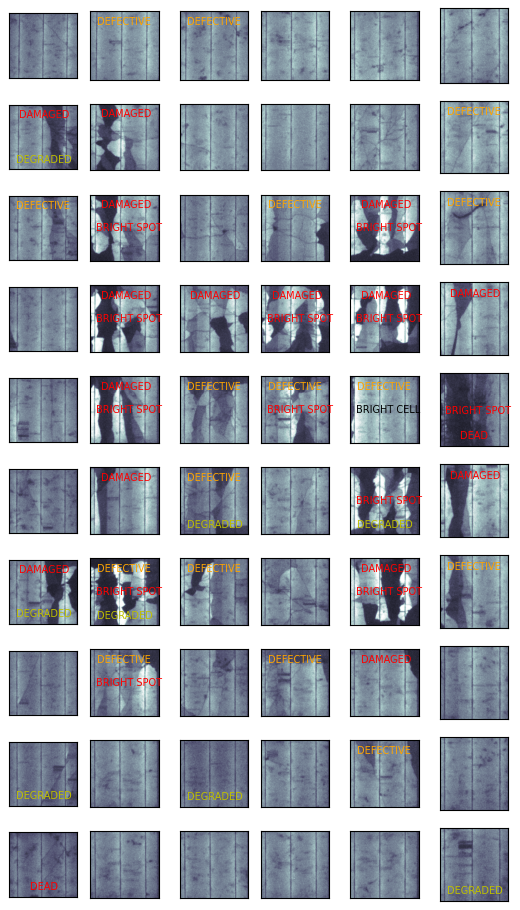

In [46]:

''' make classified module image '''

_min = abs_stats['min']
_max = abs_stats['max']

# diplay images
_w = 5.2; _h = 9.1
fig = plt.figure(figsize = (_w, _h), constrained_layout = True)
#gs = GridSpec(6, 10, figure = fig)
gs = GridSpec(10, 6, figure = fig)
ax = []

# set normalise across all cells
norm = Normalize(vmin = -.3, vmax = 1.3)

# iterate over extracted cells
for j,__cell in enumerate(_cells[:]):

    _cell = __cell.copy().astype(np.float64)
    _cell-=_min
    _cell/=(_max-_min)

    # generate new axis
    ax.append( fig.add_subplot(gs[ j//6:1+j//6, (j%6):1+(j%6) ]) )

    #ax[-1].imshow(_cell, cmap = 'viridis', norm = norm)
    ax[-1].imshow(_cell, cmap = 'bone', norm = norm)

    # add degradation/defective text labels to cells
    if j in _dead:
        ax[-1].text(.3*_cell.shape[1],.9*_cell.shape[0], 'DEAD', color = 'r', size=7)
    if j in _degr:
        ax[-1].text(.1*_cell.shape[1],.9*_cell.shape[0], 'DEGRADED', color = 'y', size=7)
    if j in _damg:
        ax[-1].text(.15*_cell.shape[1],.2*_cell.shape[0], 'DAMAGED', color = 'r', size=7)
    if j in _defc:
        ax[-1].text(.1*_cell.shape[1],.2*_cell.shape[0], 'DEFECTIVE', color = 'orange', size=7)
    if j in _hots:
        ax[-1].text(.08*_cell.shape[1],.55*_cell.shape[0], 'BRIGHT SPOT', color = 'r', size=7)
    if j in _hotc:
        ax[-1].text(.08*_cell.shape[1],.55*_cell.shape[0], 'BRIGHT CELL', color = 'k', size=7)

for k in range(len(ax)):
    ax[k].set_xticks([]); ax[k].set_yticks([])

#plt.tight_layout()
#plt.savefig('./results/{}-out.png'.format(file_name.split('.')[0]), dpi=250)
#plt.savefig('../pvmod_libs/static/result.png'.format(), dpi=250)
plt.show()



/tmp/ipykernel_45350/1997762685.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  _w = 4; _h = 6; fig = plt.figure(figsize = (_w, _h))


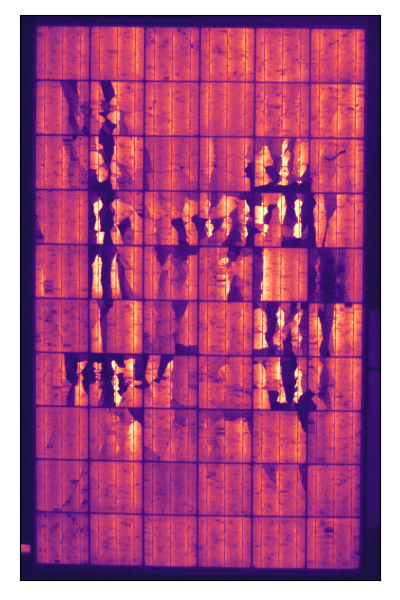

In [47]:
''' plot module image '''

# diplay images
_w = 4; _h = 6; fig = plt.figure(figsize = (_w, _h))
ax = []; ax.append(fig.add_subplot(111))#; ax.append(fig.add_subplot(122))

# display image, limit range 8-bit
#ax[0].imshow(img, cmap = 'magma', vmin = 0, vmax = 256)
ax[0].imshow(img, cmap = 'magma')#, vmin = img.min(), vmax = img.max())
ax[0].set_xticks([]); ax[0].set_yticks([])

plt.tight_layout()
plt.show()